In [ ]:
!pip install catboost
!pip install pandas-summary
!pip install optuna
!pip install pycaret
!pip install --upgrade numpy scikit-learn pycaret

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.2/233.2 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.6/50.6 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 48.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 5.1 MB/s eta 0:00:00
  

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import io as sio
import seaborn as sns
from sklearn.preprocessing import LabelBinarizer , StandardScaler ,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , accuracy_score,ConfusionMatrixDisplay
from xgboost import XGBClassifier, plot_importance
from sklearn.linear_model import LogisticRegression , RidgeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from numpy import absolute
from numpy import sqrt
from numpy import mean
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.utils import resample
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier , VotingClassifier , RandomForestClassifier
import numpy as np
import pandas as pd
from pandas_summary import DataFrameSummary
import seaborn as sns
import matplotlib.pyplot as plt
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, VotingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
#from sklearn.inspection import plot_partial_dependence
#from sklearn.metrics import classification_report, recall_score, plot_confusion_matrix, plot_precision_recall_curve, roc_curve
from sklearn.metrics import log_loss,roc_auc_score,precision_score,f1_score,recall_score,roc_curve,auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score,fbeta_score,matthews_corrcoef
#import matplotlib as mlp
#from matplotlib import Artist
#from matplotlib.artist import Artist
#import seaborn as sns
import warnings
import optuna
from optuna.samplers import TPESampler
from tqdm import tqdm
from pycaret.classification import *

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Metabolic Syndrome.csv')
data

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
0,62161,22,Male,Single,8200.0,White,81.0,23.3,0,3.88,4.9,92,41,84,0
1,62164,44,Female,Married,4500.0,White,80.1,23.2,0,8.55,4.5,82,28,56,0
2,62169,21,Male,Single,800.0,Asian,69.6,20.1,0,5.07,5.4,107,43,78,0
3,62172,43,Female,Single,2000.0,Black,120.4,33.3,0,5.22,5.0,104,73,141,0
4,62177,51,Male,Married,NaN,Asian,81.1,20.1,0,8.13,5.0,95,43,126,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2396,71901,48,Female,Married,1000.0,Other,NaN,59.7,0,22.11,5.8,152,57,107,0
2397,71904,30,Female,Single,2000.0,Asian,NaN,18.0,0,2.90,7.9,91,90,91,0
2398,71909,28,Male,Single,800.0,MexAmerican,100.8,29.4,0,2.78,6.2,99,47,84,0
2399,71911,27,Male,Married,8200.0,MexAmerican,106.6,31.3,0,4.15,6.2,100,41,124,1


In [ ]:
data.shape

(2401, 15)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2401 entries, 0 to 2400
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   seqn               2401 non-null   int64  
 1   Age                2401 non-null   int64  
 2   Sex                2401 non-null   object 
 3   Marital            2193 non-null   object 
 4   Income             2284 non-null   float64
 5   Race               2401 non-null   object 
 6   WaistCirc          2316 non-null   float64
 7   BMI                2375 non-null   float64
 8   Albuminuria        2401 non-null   int64  
 9   UrAlbCr            2401 non-null   float64
 10  UricAcid           2401 non-null   float64
 11  BloodGlucose       2401 non-null   int64  
 12  HDL                2401 non-null   int64  
 13  Triglycerides      2401 non-null   int64  
 14  MetabolicSyndrome  2401 non-null   int64  
dtypes: float64(5), int64(7), object(3)
memory usage: 281.5+ KB


In [ ]:
data.describe()

,seqn,Age,Income,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
count,2401.000000,2401.000000,2284.000000,2316.000000,2375.000000,2401.000000,2401.000000,2401.000000,2401.000000,2401.000000,2401.000000,2401.000000
mean,67030.674302,48.691795,4005.253940,98.307254,28.702189,0.154102,43.626131,5.489046,108.247813,53.369429,128.125364,0.342357
std,2823.565114,17.632852,2954.032186,16.252634,6.662242,0.422780,258.272829,1.439358,34.820657,15.185537,95.322477,0.474597
min,62161.000000,20.000000,300.000000,56.200000,13.400000,0.000000,1.400000,1.800000,39.000000,14.000000,26.000000,0.000000
25%,64591.000000,34.000000,1600.000000,86.675000,24.000000,0.000000,4.450000,4.500000,92.000000,43.000000,75.000000,0.000000
50%,67059.000000,48.000000,2500.000000,97.000000,27.700000,0.000000,7.070000,5.400000,99.000000,51.000000,103.000000,0.000000
75%,69495.000000,63.000000,6200.000000,107.625000,32.100000,0.000000,13.690000,6.400000,110.000000,62.000000,150.000000,1.000000
max,71915.000000,80.000000,9000.000000,176.000000,68.700000,2.000000,5928.000000,11.300000,382.000000,156.000000,1562.000000,1.000000


In [ ]:
data.isnull().sum()

,0
seqn,0
Age,0
Sex,0
Marital,208
Income,117
Race,0
WaistCirc,85
BMI,26
Albuminuria,0
UrAlbCr,0


# Data Preprocessing

In [ ]:
# Fill null values in 'Income', 'WaistCirc', and 'BMI' with the mean
data['Income'] = data['Income'].fillna(data['Income'].mean())
data['WaistCirc'] = data['WaistCirc'].fillna(data['WaistCirc'].mean())
data['BMI'] = data['BMI'].fillna(data['BMI'].mean())

In [ ]:
data.isnull().sum()

,0
seqn,0
Age,0
Sex,0
Marital,208
Income,0
Race,0
WaistCirc,0
BMI,0
Albuminuria,0
UrAlbCr,0


Filled the null values of Income, WaistCirc and BMI
Now I will label encode categorical values to turn them into numerical values and then deal with the null values of Marital and Column later.

In [ ]:
print(data['Race'].value_counts())
print(data['Sex'].value_counts())
print(data['Marital'].value_counts())

Race
White          933
Black          548
Asian          349
Hispanic       257
MexAmerican    253
Other           61
Name: count, dtype: int64
Sex
Female    1211
Male      1190
Name: count, dtype: int64
Marital
Married      1192
Single        498
Divorced      242
Widowed       166
Separated      95
Name: count, dtype: int64


Now I will do label encoding of these 3 features.

In [ ]:
# Label Encoding
# Race Column
race_mapping = {'White': 0, 'Black': 1, 'Asian': 2, 'Hispanic': 3, 'MexAmerican': 4, 'Other': 5}
data['Race'] = data['Race'].map(race_mapping)

# Sex Column
sex_mapping = {'Male': 1, 'Female': 0}
data['Sex'] = data['Sex'].map(sex_mapping)

# Marital Column
marital_mapping = {'Married': 1, 'Single': 0, 'Divorced': 3, 'Widowed': 4, 'Separated': 5}
data['Marital'] = data['Marital'].map(marital_mapping)

In [ ]:
data['Marital'] = data['Marital'].fillna(data['Marital'].mean())

In [ ]:
data.isnull().sum()

,0
seqn,0
Age,0
Sex,0
Marital,0
Income,0
Race,0
WaistCirc,0
BMI,0
Albuminuria,0
UrAlbCr,0


Steps so far:
1. Libraries Installation
2. Data Loading
3. Data Description
4. Data Preprocessing
    a) Checking null values
    b) Filling null values using the Mean method
    c) Label encoding categorical features
    d) Filling null values on the left out columns.

In [ ]:
data.head()

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
0,62161,22,1,0.0,8200.00000,0,81.0,23.3,0,3.88,4.9,92,41,84,0
1,62164,44,0,1.0,4500.00000,0,80.1,23.2,0,8.55,4.5,82,28,56,0
2,62169,21,1,0.0,800.00000,2,69.6,20.1,0,5.07,5.4,107,43,78,0
3,62172,43,0,0.0,2000.00000,1,120.4,33.3,0,5.22,5.0,104,73,141,0
4,62177,51,1,1.0,4005.25394,2,81.1,20.1,0,8.13,5.0,95,43,126,0


In [ ]:
print(data['MetabolicSyndrome'].value_counts())

MetabolicSyndrome
0    1579
1     822
Name: count, dtype: int64


In [ ]:
# Define features (X) and target (y)
X = data.drop('MetabolicSyndrome', axis=1)
y = data['MetabolicSyndrome']

# Scale the features using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create a new DataFrame with scaled features and the original target variable
scaled_data = pd.DataFrame(X_scaled, columns=X.columns)
scaled_data['MetabolicSyndrome'] = y

# Display the scaled dataset
scaled_data.head()

,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
0,-1.725014,-1.514069,1.008785,-1.061631,1.456242e+00,-0.943516,-1.084489,-0.815465,-0.364574,-0.153924,-0.409328,-0.466711,-0.814723,-0.463003,0
1,-1.723951,-0.266138,-0.991292,-0.300049,1.717553e-01,-0.943516,-1.140883,-0.830560,-0.364574,-0.135839,-0.687287,-0.753957,-1.670979,-0.756804,0
2,-1.722180,-1.570793,1.008785,-1.061631,-1.112731e+00,0.415441,-1.798823,-1.298507,-0.364574,-0.149316,-0.061878,-0.035843,-0.682991,-0.525960,0
3,-1.721117,-0.322862,-0.991292,-1.061631,-6.961411e-01,-0.264037,1.384352,0.694043,-0.364574,-0.148735,-0.339838,-0.122017,1.292984,0.135092,0
4,-1.719346,0.130931,1.008785,-0.300049,1.578694e-16,0.415441,-1.078222,-1.298507,-0.364574,-0.137465,-0.339838,-0.380538,-0.682991,-0.022301,0


## EDA

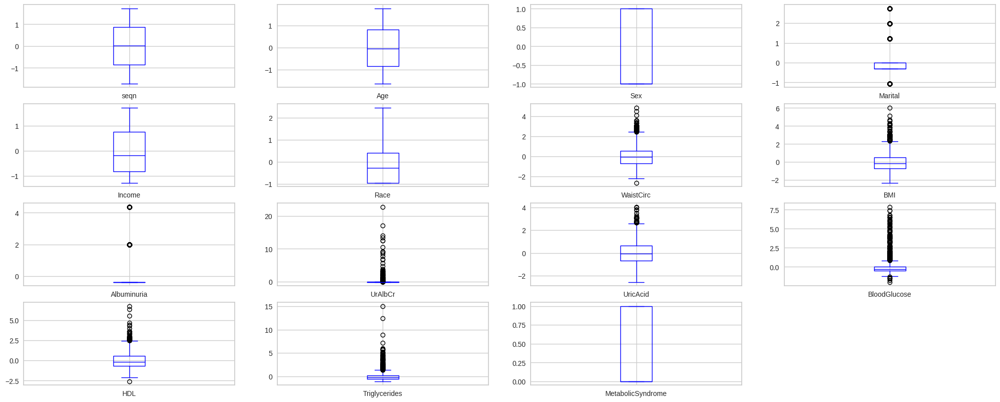

In [ ]:
#boxplot
scaled_data.plot(color = 'blue', kind='box', figsize=(25, 15), subplots=True, layout=(6,4))
plt.show()

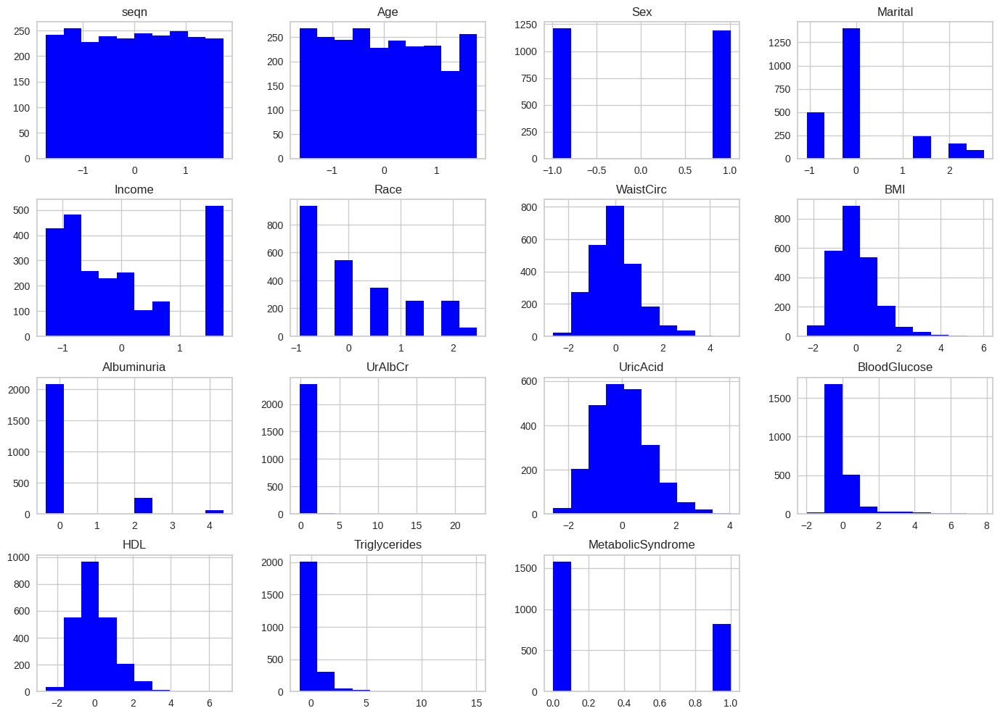

In [ ]:
#histogram
scaled_data.hist(color='blue',bins=10,figsize=(17,12))
plt.show()

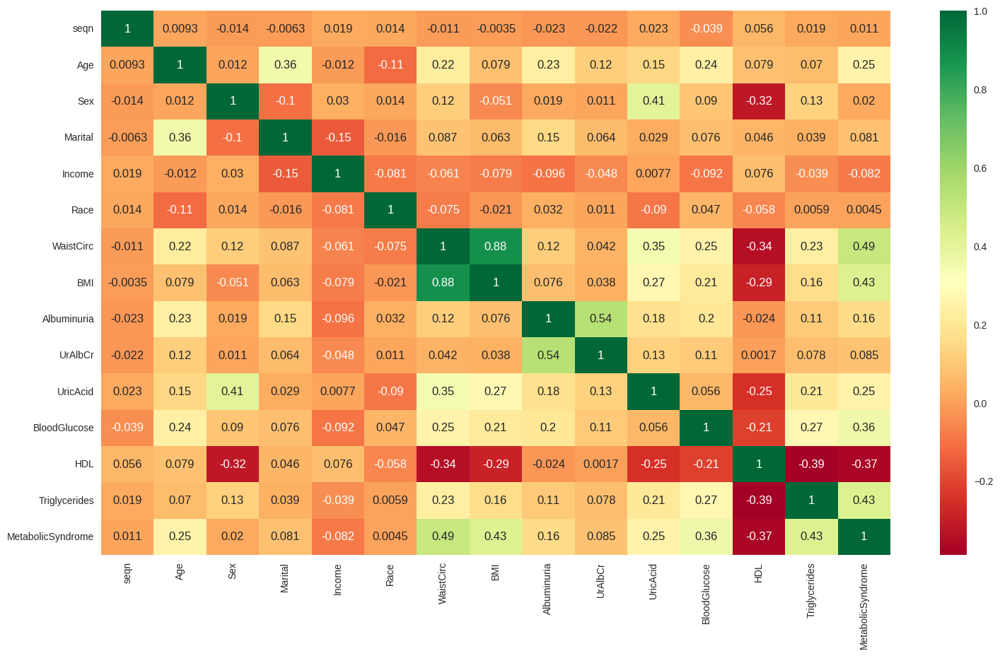

In [ ]:
#get correlations of each features in dataset
corrmat = scaled_data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(18,10))
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")
plt.show()

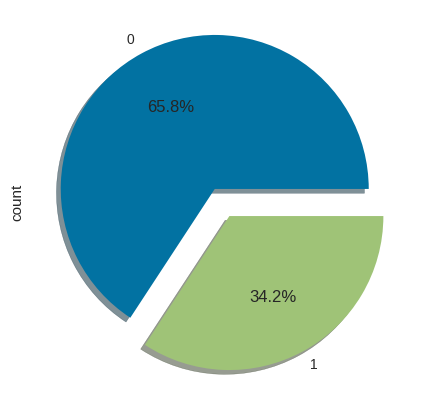

In [ ]:
plt.figure(figsize=(15, 5))
scaled_data['MetabolicSyndrome'].value_counts().plot.pie(explode=[0.1,0.1],autopct='%1.1f%%',shadow=True)
plt.show()

In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency
import numpy as np

# Function to calculate Cramer's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1)**2) / (n - 1)
    kcorr = k - ((k - 1)**2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))

# List of categorical features
categorical_features = ['Race', 'Sex', 'Marital']

# Perform tests for each feature
for feature in categorical_features:
    # Chi-squared test
    contingency_table = pd.crosstab(scaled_data[feature], scaled_data['MetabolicSyndrome'])
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-squared test for {feature} vs. MetabolicSyndrome:")
    print(f"  Chi2 Statistic: {chi2_stat:.3f}")
    print(f"  P-value: {p_value:.3f}")

    # Cramer's V (if association is significant)
    if p_value < 0.05:  # Adjust significance level as needed
        v = cramers_v(scaled_data[feature], scaled_data['MetabolicSyndrome'])
        print(f"  Cramer's V: {v:.3f}")
    print("-" * 30)  # Separator for clarity

Chi-squared test for Race vs. MetabolicSyndrome:
  Chi2 Statistic: 30.379
  P-value: 0.000
  Cramer's V: 0.103
------------------------------
Chi-squared test for Sex vs. MetabolicSyndrome:
  Chi2 Statistic: 0.911
  P-value: 0.340
------------------------------
Chi-squared test for Marital vs. MetabolicSyndrome:
  Chi2 Statistic: 33.775
  P-value: 0.000
  Cramer's V: 0.109
------------------------------


Interpretation of the test:

Race:
Test Results: Chi-squared Statistic: 30.379, P-value: 0.000, Cramer's V: 0.103
Interpretation: There is a statistically significant but weak association between race and Metabolic Syndrome

Sex:
Test Results: Chi-squared Statistic: 0.911, P-value: 0.340
Interpretation: There is no statistically significant association between sex and Metabolic Syndrome.

Marital Status:
Test Results: Chi-squared Statistic: 33.775, P-value: 0.000, Cramer's V: 0.109
Interpretation: There is a statistically significant but weak association between marital status and Metabolic Syndrome. While marital status is likely related to the syndrome, the practical impact might be limited.

Outliers Handling

In [ ]:
# IQR method for outlier detection and removal
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df_filtered

# Usage for each column (excluding the target variable):
for col in scaled_data.columns[:-1]:  # Iterate through all columns except the last one
    scaled_data = remove_outliers_iqr(scaled_data, col)

# Display the data after removing outliers
print(scaled_data.shape)
scaled_data.head()

(932, 15)


,seqn,Age,Sex,Marital,Income,Race,WaistCirc,BMI,Albuminuria,UrAlbCr,UricAcid,BloodGlucose,HDL,Triglycerides,MetabolicSyndrome
1,-1.723951,-0.266138,-0.991292,-0.300049,1.717553e-01,-0.943516,-1.140883,-0.830560,-0.364574,-0.135839,-0.687287,-0.753957,-1.670979,-0.756804,0
4,-1.719346,0.130931,1.008785,-0.300049,1.578694e-16,0.415441,-1.078222,-1.298507,-0.364574,-0.137465,-0.339838,-0.380538,-0.682991,-0.022301,0
7,-1.715095,-1.060276,-0.991292,-0.300049,7.619249e-01,0.415441,-1.134617,-0.951320,-0.364574,-0.134948,0.841491,-0.725233,-0.353662,-0.389552,0
9,-1.712970,-0.776655,1.008785,0.000000,-5.225618e-01,-0.264037,0.043408,-0.075806,-0.364574,-0.160391,0.841491,-0.409262,-0.485394,-0.442017,0
10,-1.711553,0.471276,1.008785,0.000000,1.733969e+00,-0.943516,0.594824,-0.105996,-0.364574,-0.152840,0.355061,-0.236915,-1.209918,-0.316102,1


# Implementing PyCaret

In [ ]:
new_data = scaled_data.drop('seqn', axis=1)

In [ ]:
from pycaret.classification import *
clf_setup = setup(data=new_data,
                  target='MetabolicSyndrome',
                  session_id=42,
                  preprocess=True,
                  normalize=True,
                  transformation=True,
                  index=False,
                  verbose=True)

,Description,Value
0,Session id,42
1,Target,MetabolicSyndrome
2,Target type,Binary
3,Original data shape,"(932, 14)"
4,Transformed data shape,"(932, 14)"
5,Transformed train set shape,"(652, 14)"
6,Transformed test set shape,"(280, 14)"
7,Numeric features,13
8,Preprocess,True
9,Imputation type,simple


In [ ]:
print('comparing models for metabolic syndrome data and selecting top 5 out of them based on accuracy score')
top_model = compare_models(n_select = 5, sort='Accuracy')

comparing models for metabolic syndrome data and selecting top 5 out of them based on accuracy score


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8896,0.9445,0.7242,0.8120,0.7578,0.6872,0.6947,0.2610
catboost,CatBoost Classifier,0.8788,0.9510,0.6917,0.7947,0.7293,0.6527,0.6623,2.7790
lightgbm,Light Gradient Boosting Machine,0.8773,0.9419,0.6979,0.7763,0.7261,0.6484,0.6558,0.4970
lda,Linear Discriminant Analysis,0.8743,0.9146,0.6408,0.8131,0.7054,0.6281,0.6420,0.0930
xgboost,Extreme Gradient Boosting,0.8728,0.9470,0.6979,0.7685,0.7186,0.6383,0.6480,0.2400
lr,Logistic Regression,0.8682,0.9170,0.6338,0.7864,0.6954,0.6130,0.6228,0.7970
ridge,Ridge Classifier,0.8681,0.9147,0.5629,0.8480,0.6680,0.5907,0.6145,0.1440
rf,Random Forest Classifier,0.8665,0.9416,0.6192,0.7920,0.6855,0.6032,0.6167,0.5030
ada,Ada Boost Classifier,0.8620,0.9296,0.6404,0.7567,0.6885,0.6011,0.6081,0.1950
et,Extra Trees Classifier,0.8619,0.9305,0.5438,0.8320,0.6415,0.5635,0.5910,0.2430


Processing:   0%|          | 0/73 [00:00<?, ?it/s]

In [ ]:
print("Top 5 Models are:")
for model in top_model:
  print(type(model).__name__)

Top 5 Models are:
GradientBoostingClassifier
CatBoostClassifier
LGBMClassifier
LinearDiscriminantAnalysis
XGBClassifier


In [ ]:
# Create a stacked ensemble model
stacker = stack_models(estimator_list=top_model, meta_model=XGBClassifier(), fold=10, method='auto')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8636,0.9250,0.8125,0.6842,0.7429,0.6510,0.6554
1,0.8788,0.9312,0.5625,0.9000,0.6923,0.6218,0.6484
2,0.8923,0.9480,0.6000,0.9000,0.7200,0.6566,0.6773
3,0.8923,0.9533,0.8000,0.7500,0.7742,0.7036,0.7042
4,0.7846,0.8893,0.5333,0.5333,0.5333,0.3933,0.3933
5,0.8769,0.9067,0.6667,0.7692,0.7143,0.6364,0.6390
6,0.9692,0.9947,0.9333,0.9333,0.9333,0.9133,0.9133
7,0.8769,0.9541,0.6250,0.8333,0.7143,0.6379,0.6486
8,0.8462,0.8929,0.6250,0.7143,0.6667,0.5672,0.5694


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
# Evaluate the stacker model
print(stacker)
evaluate_model(stacker)

StackingClassifier(cv=5,
                   estimators=[('Gradient Boosting Classifier',
                                GradientBoostingClassifier(ccp_alpha=0.0,
                                                           criterion='friedman_mse',
                                                           init=None,
                                                           learning_rate=0.1,
                                                           loss='log_loss',
                                                           max_depth=3,
                                                           max_features=None,
                                                           max_leaf_nodes=None,
                                                           min_impurity_decrease=0.0,
                                                           min_samples_leaf=1,
                                                           min_samples_split=2,
                                                     

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
# Finalize the stacker model
final_stacker = finalize_model(stacker)
final_stacker

Pipeline(memory=Memory(location=None),
         steps=[('numerical_imputer',
                 TransformerWrapper(exclude=None,
                                    include=['Age', 'Sex', 'Marital', 'Income',
                                             'Race', 'WaistCirc', 'BMI',
                                             'Albuminuria', 'UrAlbCr',
                                             'UricAcid', 'BloodGlucose', 'HDL',
                                             'Triglycerides'],
                                    transformer=SimpleImputer(add_indicator=False,
                                                              copy=True,
                                                              fill_value=None,
                                                              keep_empty_features=False,
                                                              missing_values=n...
                                                                  max_bin=None,
                                                                  max_cat_threshold=None,
                                                                  max_cat_to_onehot=None,
                                                                  max_delta_step=None,
                                                                  max_depth=None,
                                                                  max_leaves=None,
                                                                  min_child_weight=None,
                                                                  missing=nan,
                                                                  monotone_constraints=None,
                                                                  multi_strategy=None,
                                                                  n_estimators=None,
                                                                  n_jobs=None,
                                                                  num_parallel_tree=None,
                                                                  objective='binary:logistic', ...),
                                    n_jobs=-1, passthrough=False,
                                    stack_method='auto', verbose=0))],
         verbose=False)

## Implementing SHAP XAI Shapley Additive exPlanations

In [ ]:
import shap

In [ ]:
# Defining the Dependedent and the Independent Variable
X = new_data.drop('MetabolicSyndrome', axis=1)
y = new_data['MetabolicSyndrome']

In [ ]:
# Instead of passing the pipeline object directly, pass a function
# that calls the pipeline's 'predict' method:

# Explain the model's predictions using SHAP values
# The lambda function creates a callable object that takes data as input and
# returns the predictions of the final_stacker pipeline's predict_proba method.
explainer = shap.Explainer(lambda x: final_stacker.predict_proba(x)[:,1], X)
shap_values = explainer(X)


PermutationExplainer explainer: 100%|██████████| 932/932 [27:39<00:00,  1.52s/it]
PermutationExplainer explainer: 933it [27:41,  1.79s/it]


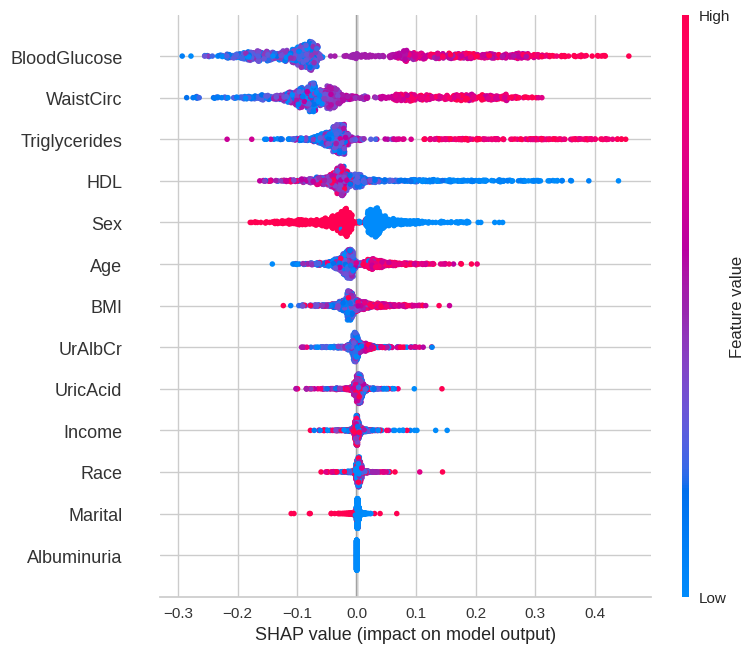

In [ ]:
shap.summary_plot(shap_values, X)

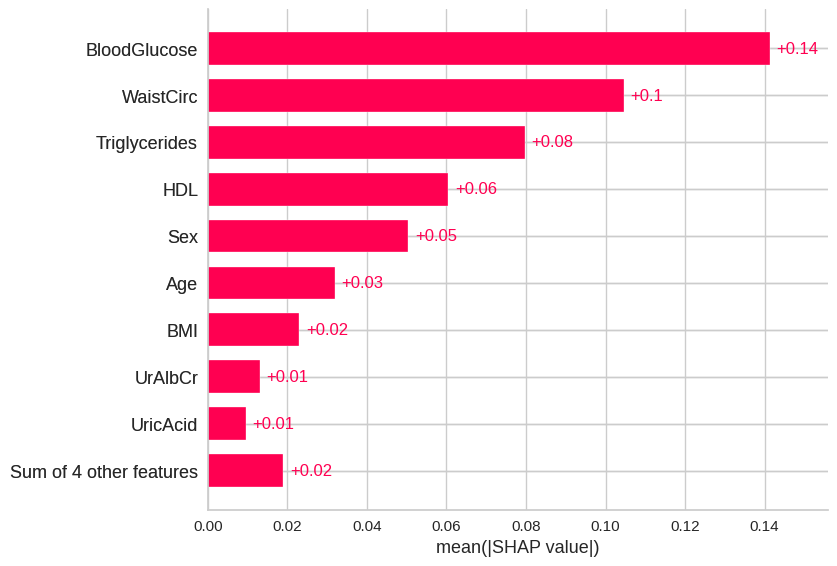

In [ ]:
shap.plots.bar(shap_values)

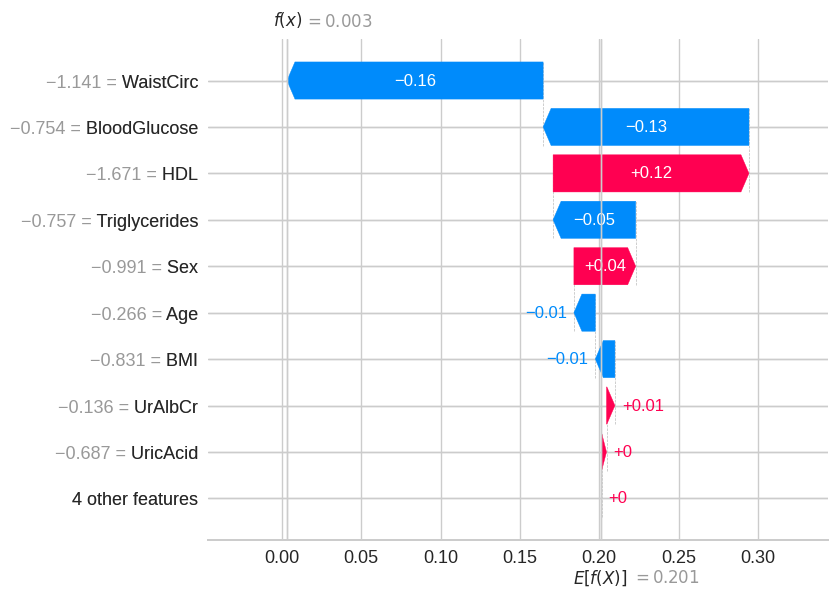

In [ ]:
shap.plots.waterfall(shap_values[0])

## LIME Local  Interpretable Model-agnostic Explanations

In [ ]:
!pip install lime

import lime
import lime.lime_tabular

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=0b5d2cf90c10ba4ebf256f7a083477bba5ca4f7e89b10e12926cd487b6c7da1f
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
# Create a LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X.values,  # Use the NumPy array representation of X
    feature_names=X.columns.tolist(), # Feature names for interpretability
    class_names=['No Metabolic Syndrome', 'Metabolic Syndrome'], # Class names
    mode='classification' # or 'regression' depending on the task
)

In [ ]:
# Choose an instance to explain
instance_index = 5 # Example: explain the first instance
instance = X.iloc[instance_index]

In [ ]:
# Explain the instance
explanation = explainer.explain_instance(
    instance.values,
    lambda x: final_stacker.predict_proba(pd.DataFrame(x, columns=X.columns)), # Use a lambda function to wrap the prediction
    num_features=6  # Number of features to show in explanation
)

In [ ]:
# Show the explanation
explanation.show_in_notebook(show_table=True)

In [ ]:
explanation.as_list()

[('BloodGlucose <= -0.50', -0.1901391886055789),
 ('WaistCirc <= -0.75', -0.17534919514548003),
 ('-0.99 < Sex <= 1.01', -0.10870098983793824),
 ('Triglycerides <= -0.59', -0.10333320558932646),
 ('BMI <= -0.76', -0.03761839254999679),
 ('-0.78 < Age <= -0.21', -0.0370137277877614)]

In [ ]:
# Choose another instance to explain
instance_index_2 = 15 # explain the 15th instance
instance_2 = X.iloc[instance_index_2]

# Explain the second instance
explanation_2 = explainer.explain_instance(
    instance_2.values,
    lambda x: final_stacker.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=10  # Number of features to show in explanation
)

# Show the second explanation
explanation_2.show_in_notebook(show_table=True)
explanation_2.as_list()

[('Triglycerides > 0.07', 0.2530980182486748),
 ('-0.50 < BloodGlucose <= -0.29', -0.19437524605240294),
 ('-0.09 < HDL <= 0.57', -0.09220729251145782),
 ('Sex <= -0.99', 0.09068307237154588),
 ('-0.75 < WaistCirc <= -0.16', -0.07975113545591185),
 ('Age > 0.70', 0.060268857291510214),
 ('UrAlbCr > -0.14', 0.028146253118323257),
 ('-0.76 < BMI <= -0.21', -0.024386265285918887),
 ('UricAcid > 0.49', -0.021935422343308753),
 ('Marital <= -0.30', -0.01194032656224093)]

In [ ]:
# Choose yet another instance to explain
instance_index_3 = 100 # Explain the 100th instance
instance_3 = X.iloc[instance_index_3]

# Explain the third instance
explanation_3 = explainer.explain_instance(
    instance_3.values,
    lambda x: final_stacker.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=8  # Number of features to show in explanation
)

# Show the third explanation
explanation_3.show_in_notebook(show_table=True)
explanation_3.as_list()

[('WaistCirc > 0.34', 0.2684465586676851),
 ('-0.50 < BloodGlucose <= -0.29', -0.17905457346523374),
 ('HDL > 0.57', -0.1057092563899972),
 ('Sex <= -0.99', 0.08548870575875453),
 ('-0.59 < Triglycerides <= -0.33', -0.06940851728264667),
 ('BMI > 0.31', 0.05700986452499785),
 ('Age <= -0.78', -0.05647136896372148),
 ('UricAcid <= -0.76', 0.047102688665486545)]

# Now I will try using Boosting, Bagging, Stacking, and Voting and then choose the best model out of the 4 and implement both SHAP and LIME on that model.

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, VotingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from xgboost import XGBClassifier

In [ ]:
# X = new_data.drop('MetabolicSyndrome', axis=1)
# y = new_data['MetabolicSyndrome']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Define the top 5 base models
model1 = GradientBoostingClassifier()
model2 = CatBoostClassifier()
model3 = LGBMClassifier()
model4 = LinearDiscriminantAnalysis()
model5 = XGBClassifier()

In [ ]:
# 1. Bagging (using RandomForest)
bagging_model = RandomForestClassifier(n_estimators=100, random_state=42)
bagging_model.fit(X_train, y_train)
bagging_predictions = bagging_model.predict(X_test)

In [ ]:
# 2. Boosting
boosting_model = model1
boosting_model.fit(X_train, y_train)
boosting_predictions = boosting_model.predict(X_test)

In [ ]:
# 3. Stacking
estimators = [
    ('gb', model1),
    ('cat', model2),
    ('lgbm', model3),
    ('lda', model4),
    ('xgb', model5)
]
stacking_model = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(), cv=5)
stacking_model.fit(X_train, y_train)
stacking_predictions = stacking_model.predict(X_test)

Streaming output truncated to the last 5000 lines.
460:	learn: 0.1245077	total: 1.44s	remaining: 1.68s
461:	learn: 0.1243829	total: 1.44s	remaining: 1.68s
462:	learn: 0.1241262	total: 1.44s	remaining: 1.68s
463:	learn: 0.1239877	total: 1.45s	remaining: 1.67s
464:	learn: 0.1238424	total: 1.45s	remaining: 1.67s
465:	learn: 0.1236410	total: 1.45s	remaining: 1.66s
466:	learn: 0.1234551	total: 1.45s	remaining: 1.66s
467:	learn: 0.1233168	total: 1.45s	remaining: 1.65s
468:	learn: 0.1231126	total: 1.46s	remaining: 1.65s
469:	learn: 0.1229500	total: 1.46s	remaining: 1.64s
470:	learn: 0.1227200	total: 1.46s	remaining: 1.64s
471:	learn: 0.1223991	total: 1.46s	remaining: 1.63s
472:	learn: 0.1222336	total: 1.46s	remaining: 1.63s
473:	learn: 0.1220761	total: 1.47s	remaining: 1.63s
474:	learn: 0.1218209	total: 1.47s	remaining: 1.62s
475:	learn: 0.1216594	total: 1.47s	remaining: 1.62s
476:	learn: 0.1214609	total: 1.47s	remaining: 1.61s
477:	learn: 0.1211471	total: 1.47s	remaining: 1.61s
478:	learn: 0

In [ ]:
# 4. Voting
voting_model = VotingClassifier(estimators=estimators, voting='hard')  # or 'soft'
voting_model.fit(X_train, y_train)
voting_predictions = voting_model.predict(X_test)

Learning rate set to 0.009085
0:	learn: 0.6828118	total: 2.1ms	remaining: 2.1s
1:	learn: 0.6734196	total: 4.13ms	remaining: 2.06s
2:	learn: 0.6615297	total: 6.48ms	remaining: 2.15s
3:	learn: 0.6523027	total: 8.57ms	remaining: 2.13s
4:	learn: 0.6453793	total: 10.5ms	remaining: 2.1s
5:	learn: 0.6376983	total: 12.5ms	remaining: 2.07s
6:	learn: 0.6279888	total: 14.5ms	remaining: 2.05s
7:	learn: 0.6206392	total: 16.5ms	remaining: 2.04s
8:	learn: 0.6118977	total: 18.3ms	remaining: 2.02s
9:	learn: 0.6036338	total: 20.2ms	remaining: 2s
10:	learn: 0.5954945	total: 22.3ms	remaining: 2s
11:	learn: 0.5864885	total: 24.2ms	remaining: 1.99s
12:	learn: 0.5799778	total: 26.2ms	remaining: 1.99s
13:	learn: 0.5717020	total: 27.9ms	remaining: 1.97s
14:	learn: 0.5634745	total: 29.8ms	remaining: 1.95s
15:	learn: 0.5585213	total: 31.5ms	remaining: 1.94s
16:	learn: 0.5512909	total: 33.5ms	remaining: 1.94s
17:	learn: 0.5446579	total: 35.4ms	remaining: 1.93s
18:	learn: 0.5382668	total: 37.5ms	remaining: 1.93s
1

In [ ]:
# Evaluate the models based on accuracy score
from sklearn.metrics import accuracy_score

print(f"Bagging Accuracy: {accuracy_score(y_test, bagging_predictions)}")
print(f"Boosting Accuracy: {accuracy_score(y_test, boosting_predictions)}")
print(f"Stacking Accuracy: {accuracy_score(y_test, stacking_predictions)}")
print(f"Voting Accuracy: {accuracy_score(y_test, voting_predictions)}")

Bagging Accuracy: 0.8663101604278075
Boosting Accuracy: 0.8716577540106952
Stacking Accuracy: 0.8983957219251337
Voting Accuracy: 0.8823529411764706


In [ ]:
import shap
import lime
import lime.lime_tabular
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split

In [ ]:
# Evaluate the stacking model (to double-check)
print(f"Stacking Accuracy: {accuracy_score(y_test, stacking_predictions)}")

Stacking Accuracy: 0.8983957219251337


# Since Stacking Model had the highest score we will proceed with it.

# SHAP

In [ ]:
# SHAP Explanations for Stacking
explainer = shap.Explainer(stacking_model.predict_proba, X)
shap_values = explainer(X)


PermutationExplainer explainer: 100%|██████████| 932/932 [20:12<00:00,  1.15s/it]
PermutationExplainer explainer: 933it [20:13,  1.31s/it]


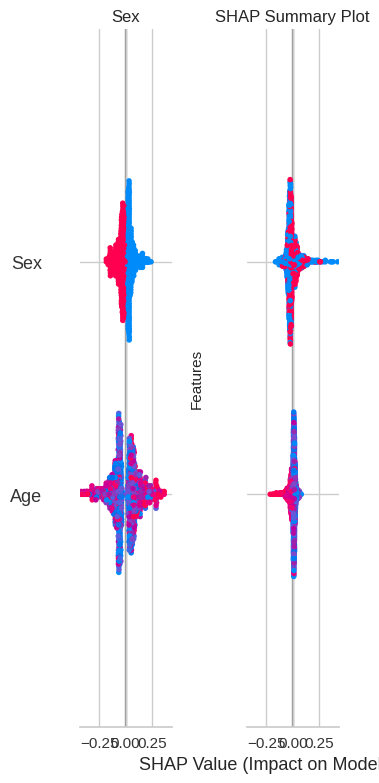

In [70]:
import matplotlib.pyplot as plt
shap.summary_plot(shap_values, X.values, feature_names=X.columns, show=False)
plt.gcf().set_size_inches(12, 8)
plt.title("SHAP Summary Plot")
plt.xlabel("SHAP Value (Impact on Model Output)")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

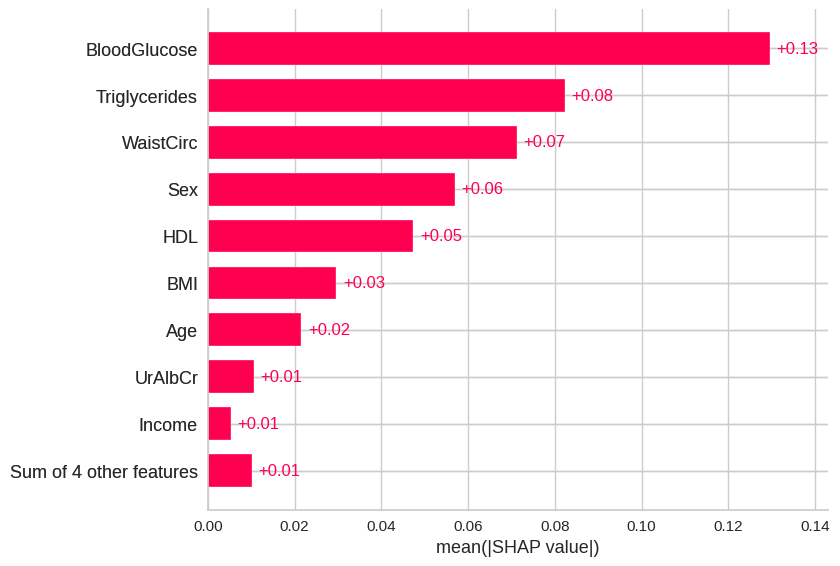

In [73]:
shap.plots.bar(shap_values[:, :, 0])

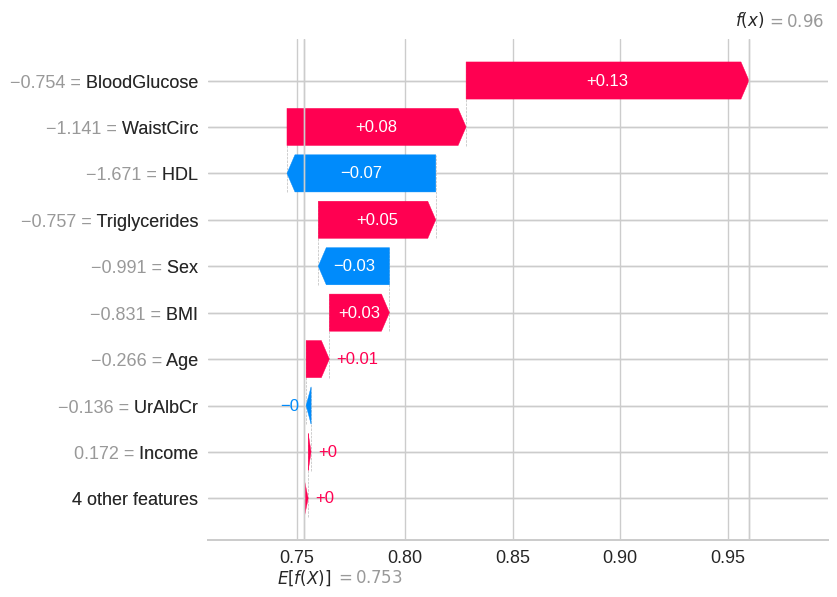

In [76]:
shap.plots.waterfall(shap_values[0, :, 0])

# LIME

In [77]:
# LIME Explanations for Stacking
explainer = lime.lime_tabular.LimeTabularExplainer(
    X.values,
    feature_names=X.columns.tolist(),
    class_names=['No Metabolic Syndrome', 'Metabolic Syndrome'],
    mode='classification'
)

In [79]:
instance_index = 5
instance = X.iloc[instance_index]
explanation = explainer.explain_instance(
    instance.values,
    stacking_model.predict_proba,
    num_features=6
)
explanation.show_in_notebook(show_table=True)

In [81]:
# Function to predict probabilities using the stacking model
def predict_proba_stacking(instances):
    return stacking_model.predict_proba(pd.DataFrame(instances, columns=X.columns))


for i in range(3):

    instance_index = i * 50  # Indices for the instances
    instance = X.iloc[instance_index]
    explanation = explainer.explain_instance(
        instance.values,
        predict_proba_stacking,
        num_features=10  # Show top 10 features
    )
    explanation.show_in_notebook(show_table=True)

# Evalution Summary

In [88]:
# Top 5  models and evaluation scores
print("Top 5 Models and Evaluation Scores (accuracy):")
for i in range(min(5,len(top_model))):
  print(f"{i+1}. Model: {type(top_model[i]).__name__}")

Top 5 Models and Evaluation Scores (accuracy):
1. Model: GradientBoostingClassifier
2. Model: CatBoostClassifier
3. Model: LGBMClassifier
4. Model: LinearDiscriminantAnalysis
5. Model: XGBClassifier


In [89]:
# Accuracy scores for boosting, bagging, stacking, and voting
print("\nAccuracy Scores:")
print(f"Boosting Accuracy: {accuracy_score(y_test, boosting_predictions)}")
print(f"Bagging Accuracy: {accuracy_score(y_test, bagging_predictions)}")
print(f"Stacking Accuracy: {accuracy_score(y_test, stacking_predictions)}")
print(f"Voting Accuracy: {accuracy_score(y_test, voting_predictions)}")


Accuracy Scores:
Boosting Accuracy: 0.8716577540106952
Bagging Accuracy: 0.8663101604278075
Stacking Accuracy: 0.8983957219251337
Voting Accuracy: 0.8823529411764706


# End